In [ ]:
!pip install oidv6
!pip install --upgrade oidv6
!pip install d2l
!pip install --upgrade --force-reinstall --no-deps albumentations
!pip install -U --pre tensorflow=="2.*"
!pip install tf_slim
!pip install -q -U albumentations
!pip install matplotlib==3.1.3

  Using cached albumentations-1.1.0-py3-none-any.whl (102 kB)
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.1.0
    Uninstalling albumentations-1.1.0:
      Successfully uninstalled albumentations-1.1.0


In [ ]:
!oidv6 downloader en --dataset /content/GMM/OIDv6 --type_data all --classes headphones coffee raven --limit 600

--------------------------------------------------------------------------------
OIDv6 - Downloading single or multiple classes from the Open Images V6 Dataset ...
--------------------------------------------------------------------------------
[2022-04-04 17:14:50] Start: 
	Author: Dmitry Ryumin
	Email: dl_03.03.1991@mail.ru
	Maintainer: Dmitry Ryumin
	Version: 1.0.5
--------------------------------------------------------------------------------
[2022-04-04 17:14:50] Checking command line arguments for validity ...
[2022-04-04 17:14:50] Creating Directories for Metadata ...
--------------------------------------------------------------------------------
[2022-04-04 17:14:50] Downloading "headphones" ...
    File "class-descriptions-boxable.csv" not found ...
        Do you want to download the missing file? [Y/n] Y
        Automatic download ... 24 out of 24 (100%)                              
    File "oidv6-train-annotations-bbox.csv" not found ...
        Do you want to download 

In [ ]:
import csv
import pandas as pd
import cv2
import os
from matplotlib.patches import Circle
import pathlib
import csv
import albumentations as A
import numpy as np
import torch
import matplotlib.pyplot as plt
import random
import torchvision
import torch.nn as nn
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import os
import pickle
import random
import time
from tqdm import tqdm
from torchvision import *
from PIL import Image
from os.path import exists

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Generate CSVs with needed data for train, test and validation datasets (paths are hardcoded and generated seperately)

In [ ]:
# Delete redundant columns in detections.csv
with open('/content/drive/MyDrive/GMM/OIDv6/train/labels/detections.csv','r') as source:
    rdr= csv.reader(source)
    with open('/content/drive/MyDrive/GMM/OIDv6/train/labels/detections_clean.csv','w') as result:
        wtr= csv.writer(result)
        for r in rdr:
            if r[2] == 'LabelName':
              r.append('LabelId')
              wtr.writerow( (r[0], 'Label', r[4], r[5], r[6], r[7], 'LabelId'))

            elif r[2] == '/m/02vqfm':
              try:
                if exists('/content/drive/MyDrive/GMM/OIDv6/train/coffee/' + r[0] + '.jpg'):
                  r.append('LabelID')
                  wtr.writerow((r[0], 'Coffee', r[4], r[5], r[6], r[7], 0)) # Coffee
              except:
                  print('One image of class "Coffee" is not found')

            elif r[2] == '/m/01b7fy':
              try:
                if exists('/content/drive/MyDrive/GMM/OIDv6/train/headphones/' + r[0] + '.jpg'):
                  r.append('LabelID')
                  wtr.writerow((r[0], 'Headphones', r[4], r[5], r[6], r[7], 1)) # Headphones
              except:
                print('One image of class "Headphones" is not found')

            elif r[2] == '/m/06j2d':
              try:
                if exists('/content/drive/MyDrive/GMM/OIDv6/train/raven/' + r[0] + '.jpg'):
                  r.append('LabelID')
                  wtr.writerow((r[0], 'Raven', r[4], r[5], r[6], r[7], 2)) # Raven
              except:
                print('One image of class "Raven" is not found')

In [ ]:
with open("/content/drive/MyDrive/GMM/OIDv6/train/labels/detections_clean.csv","r") as result:
  df = pd.read_csv(result)
df.head()

,ImageID,Label,XMin,XMax,YMin,YMax,LabelId
0,000172051b2180cd,Headphones,0.413750,0.858125,0.081860,0.961860,1
1,0002f921515d14e8,Coffee,0.050625,0.836250,0.038332,0.630800,0
2,0003d7be45f109cb,Coffee,0.000000,0.498437,0.239063,0.509375,0
3,000c26b44a7b6a22,Coffee,0.729375,0.761250,0.326742,0.398305,0
4,00114124fca03a92,Headphones,0.021875,0.498750,0.191203,0.597846,1


In [ ]:
transform = A.Compose([
    A.Resize(width=256, height=256),
    A.RandomGamma(gamma_limit=(80, 120), always_apply=False, p=0.5),
    A.RandomBrightnessContrast (p=0.5),
    A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ])
    
def processing(d_type):
  labels = []
  boxes = []
  img_list = []
  paths = []
  image_dir = ''
  with open('/content/drive/MyDrive/GMM/OIDv6/' + d_type + '/labels/detections_clean.csv') as source:
      rows = csv.reader(source)
      columns = next(iter(rows))
      for row in tqdm(rows):
        labels.append(int(row[6]))
        coords = [float(row[2]), float(row[4]), float(row[3]), float(row[5])]
        if (int(row[6]) == 0):
          image_dir = '/content/drive/MyDrive/GMM/OIDv6/' + d_type + '/coffee/'
        elif (int(row[6]) == 1):
          image_dir = '/content/drive/MyDrive/GMM/OIDv6/' + d_type + '/headphones/'
        elif (int(row[6]) == 2):
          image_dir = '/content/drive/MyDrive/GMM/OIDv6/' + d_type + '/raven/'

        img_path = row[0] + '.jpg'
        img_path = os.path.join(image_dir, img_path)
        paths.append(img_path)
        img   = cv2.imread(img_path)
        image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        image = transform(image=image)["image"]
        img_list.append(image)
        xc, yc, w, h = get_h_w_xc_yc(coords)
        coords = [xc, yc, w, h]
        boxes.append(coords)

        
      return labels, boxes, img_list, paths

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels, boxes, img_list, paths = processing('train')
val_labels, val_boxes, val_img_list, val_paths = processing('validation')
test_labels, test_boxes, test_img_list, test_paths = processing('test')

combined_list = list(zip(img_list, boxes, labels))
random.shuffle(combined_list)
img_list, boxes, labels = zip(*combined_list)
    

2043it [00:47, 42.89it/s]
256it [00:05, 43.88it/s]
672it [00:16, 41.27it/s]


In [ ]:
def box_center_to_corner(boxes):
    """Convert from (center, width, height) to (upper-left, lower-right)."""
    cx, cy, w, h = boxes[0], boxes[1], boxes[2], boxes[3]
    x1 = cx - 0.5 * w
    y1 = cy - 0.5 * h
    x2 = cx + 0.5 * w
    y2 = cy + 0.5 * h
    boxes.clone().detach()
    boxes = torch.stack((x1, y1, x2, y2), axis=-1)
    return boxes

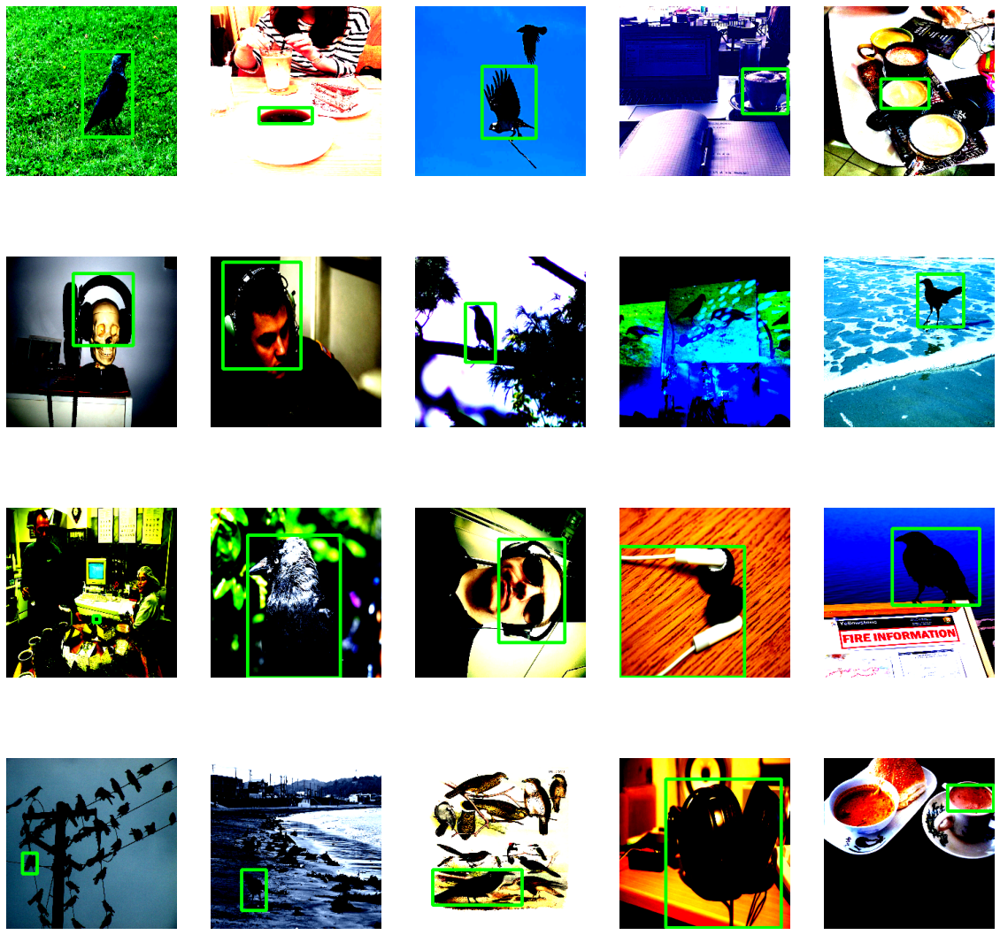

In [ ]:
plt.figure(figsize=(20,20)); 
random_range = random.sample(range(1, len(img_list)), 20)

for itr, i in enumerate(random_range, 1):
    a1, b1, a2, b2 = box_center_to_corner(torch.tensor(boxes[i]))
    img_size = 256
    
    
    x1 = a1 * img_size
    x2 = a2 * img_size
    y1 = b1 * img_size
    y2 = b2 * img_size

    image = img_list[i]
    cv2.rectangle(image, (int(x1), int(y1)),(int(x2),int(y2)),(0,255,0),3);
    img = np.clip(img_list[i], 0, 1)

    plt.subplot(4, 5, itr)
    plt.imshow(img)
    plt.axis('off')

In [ ]:
class Dataset():
    def __init__(self, train_images, train_labels, train_boxes, train_paths):
        self.images = torch.permute(torch.from_numpy(train_images),(0,3,1,2)).float()
        self.labels = torch.from_numpy(train_labels).type(torch.LongTensor)
        self.boxes = torch.from_numpy(train_boxes).float()
        self.paths = train_paths

    def __len__(self):
      return len(self.labels)

    def __getitem__(self, idx):
      return (self.images[idx],
              self.labels[idx],
              self.boxes[idx],
              self.paths[idx])

In [ ]:
num_to_labels = ['Coffee','Headphones','Raven']
train_ds = Dataset(np.array(img_list), np.array(labels), np.array(boxes), np.array(paths))
val_ds = Dataset(np.array(val_img_list),np.array(val_labels), np.array(val_boxes), val_paths)
test_ds = Dataset(np.array(test_img_list), np.array(test_labels), np.array(test_boxes), test_paths)
train_dl = torch.utils.data.DataLoader(
       train_ds, batch_size=32, shuffle=True, num_workers = 2)
val_dl = torch.utils.data.DataLoader(
       val_ds, batch_size=32, shuffle=False, num_workers = 2)
test_dl = torch.utils.data.DataLoader(
       test_ds, batch_size=32, shuffle=False, num_workers = 2)

In [ ]:
class LocalizationModel(nn.Module):

    def __init__(self):
        super(LocalizationModel, self).__init__()
        pretrained_resnet50_model = torchvision.models.resnet50(pretrained=True)
        self.defaultLayers = nn.Sequential(*list(pretrained_resnet50_model.children())[:-1])
        self.classifier = nn.Sequential(nn.Linear(2048, 3))
        self.bb = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 4),
            )

    def forward(self, x):
        x = self.defaultLayers(x)
        x = x.view(x.shape[0], -1)
        return (self.classifier(x), self.bb(x))


In [ ]:
model = LocalizationModel().cuda()
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = torch.optim.Adam(parameters, lr=0.0001)

In [ ]:
def training(model, optimizer, train_dl, val_dl, epochs):
    for i in range(epochs):
        model.train()
        total = 0
        sum_loss = 0
        for x, y_class, y_bb, _ in train_dl:
            batch = y_class.shape[0]
            x = x.cuda().float()
            y_class = y_class.cuda()
            y_bb = y_bb.cuda().float()
            out_class, out_bb = model(x)
            loss_class = F.cross_entropy(out_class, y_class, reduction="sum")
            loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
            loss_bb = loss_bb.sum()
            loss = loss_class + loss_bb/1000
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total += batch
            sum_loss += loss.item()
        train_loss = sum_loss/total
        val_loss, val_acc = validation(model, val_dl)
        print("%d epoch: Training loss: %.3f, Validation loss: %.3f, Validation accuracy: %.3f" % (i+1, train_loss, val_loss, val_acc))
    return sum_loss/total

In [ ]:
def validation(model, val_dl):
    model.eval()
    total = 0
    sum_loss = 0
    correct = 0 
    for x, y_class, y_bb, _ in val_dl:
        batch = y_class.shape[0]
        x = x.cuda().float()
        y_class = y_class.cuda()
        y_bb = y_bb.cuda().float()
        out_class, out_bb = model(x)
        loss_class = F.cross_entropy(out_class, y_class, reduction="sum")
        loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
        loss_bb = loss_bb.sum()
        loss = loss_class + loss_bb/1000
        _, pred = torch.max(out_class, 1)
        correct += pred.eq(y_class).sum().item()
        sum_loss += loss.item()
        total += batch
    return sum_loss/total, correct/total

In [ ]:
training(model, optimizer, train_dl, val_dl, 10)

1 epoch: Training loss: 0.165, Validation loss: 0.041, Validation accuracy: 0.984
2 epoch: Training loss: 0.026, Validation loss: 0.017, Validation accuracy: 0.996
3 epoch: Training loss: 0.016, Validation loss: 0.016, Validation accuracy: 0.996
4 epoch: Training loss: 0.028, Validation loss: 0.050, Validation accuracy: 0.980
5 epoch: Training loss: 0.014, Validation loss: 0.038, Validation accuracy: 0.992
6 epoch: Training loss: 0.030, Validation loss: 0.023, Validation accuracy: 0.992
7 epoch: Training loss: 0.014, Validation loss: 0.025, Validation accuracy: 0.988
8 epoch: Training loss: 0.018, Validation loss: 0.039, Validation accuracy: 0.988
9 epoch: Training loss: 0.036, Validation loss: 0.022, Validation accuracy: 0.996
10 epoch: Training loss: 0.006, Validation loss: 0.020, Validation accuracy: 0.992


0.006434033331709695

In [ ]:
training(model, optimizer, train_dl, val_dl, 5)

1 epoch: Training loss: 0.011, Validation loss: 0.022, Validation accuracy: 0.996
2 epoch: Training loss: 0.011, Validation loss: 0.018, Validation accuracy: 0.996
3 epoch: Training loss: 0.009, Validation loss: 0.019, Validation accuracy: 0.992
4 epoch: Training loss: 0.008, Validation loss: 0.017, Validation accuracy: 0.996
5 epoch: Training loss: 0.006, Validation loss: 0.014, Validation accuracy: 0.996


0.005990858805628892

In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/GMM/OIDv6/v4_eminus4lr_r50_rescaled.pth')

In [ ]:
def preprocess(img):
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = transform(image=image)["image"]
    image = np.expand_dims(image, axis=0) 
    return image

In [ ]:
def postprocess(image, results, h, w):

    [class_probs, bounding_box] = results
    class_index = torch.argmax(class_probs)
    class_label = num_to_labels[class_index]
    print(class_label)

    coords = bounding_box[0]
    coords = box_center_to_corner(coords)
    x1, y1, x2, y2 = coords

    x1 = int(w * x1)
    x2 = int(w * x2)
    y1 = int(h * y1)
    y2 = int(h * y2)

    prediction = torch.nn.functional.softmax(class_probs, 1)
    conf, classes = torch.max(prediction, dim=1)

    return class_label, (x1,y1,x2,y2),conf.item() * 100

In [ ]:
def predict_outside_dataset(image):
  model = LocalizationModel().cuda()
  model.load_state_dict(torch.load('/content/drive/MyDrive/GMM/OIDv6/eminus4lr_r50_xcycwh.pth'))
  model = model.to(device)
  model.eval()

  img  = cv2.imread(image)
  imghw = Image.open(image)
  processed_image = preprocess(img)
  result = model(torch.permute(torch.from_numpy(processed_image).float(),(0,3,1,2)).to(device))
  label, (x1, y1, x2, y2), confidence = postprocess(image, result, imghw.height, imghw.width)
  coords = (x1, y1, x2, y2)
  xc, yc, w, h = get_h_w_xc_yc(coords)

  print('Height: %.3f, width: %.3f, xc: %.3f, yc: %.3f' % (h, w, xc, yc))
  print('Class: {}'.format(label))
  print('Confidence: {}'.format(confidence))
  
  cv2.circle(img, (int(xc), int(yc)), radius=25, color=(0, 0, 255), thickness=-1)
  cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 100), 2)
  plt.figure(figsize=(10,10))
  plt.imshow(img[:,:,::-1])

Headphones
Height: 1265.000, width: 718.000, xc: 1556.000, yc: 1715.500
Class: Headphones
Confidence: 99.99946355819702
Coffee
Height: 1426.000, width: 932.000, xc: 1571.000, yc: 1571.000
Class: Coffee
Confidence: 56.54779076576233
Raven
Height: 2028.000, width: 1418.000, xc: 2118.000, yc: 1614.000
Class: Raven
Confidence: 99.99995231628418


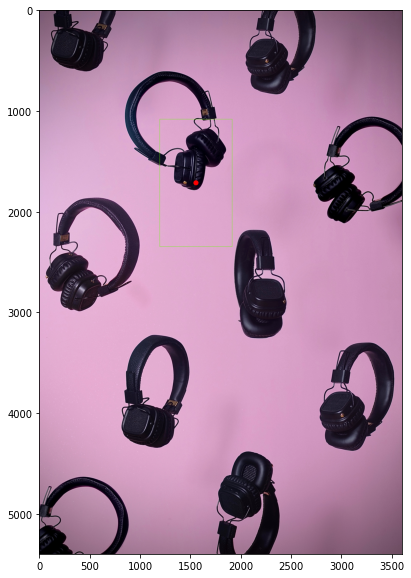

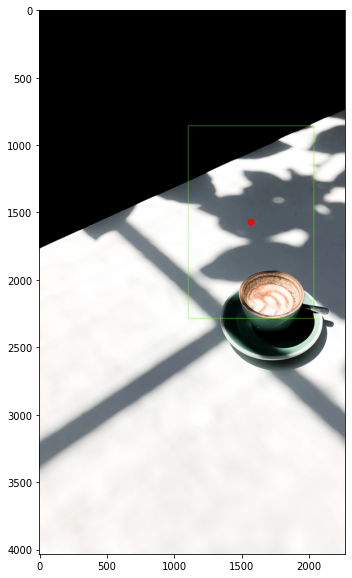

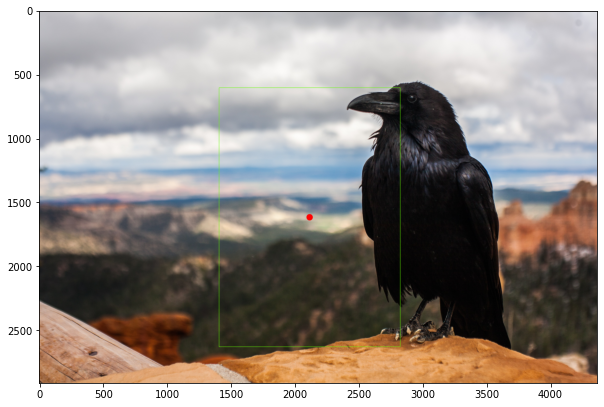

In [ ]:
predict_outside_dataset('/content/drive/MyDrive/GMM/OIDv6/custom/0.jpg')
predict_outside_dataset('/content/drive/MyDrive/GMM/OIDv6/custom/1.jpg')
predict_outside_dataset('/content/drive/MyDrive/GMM/OIDv6/custom/2.jpg')


In [ ]:
def predict(test_data):
  image, label, pboxes, path = test_data

  model = LocalizationModel().cuda()
  model.load_state_dict(torch.load('/content/drive/MyDrive/GMM/OIDv6/v3_eminus4lr_r50_rescaled.pth'))
  model = model.to(device)
  model.eval()

  pboxes = box_center_to_corner(pboxes)
  imghw = Image.open(path)
  img  = cv2.imread(path)
  processed_image = preprocess(img)
  result = model(torch.permute(torch.from_numpy(processed_image).float(),(0,3,1,2)).to(device))
  label, (x1, y1, x2, y2), confidence = postprocess(path, result, imghw.height, imghw.width )
  class_probs, _ = result
  coords = (x1, y1, x2, y2) 
  coords = torch.tensor(coords)

  p_x1 = pboxes[0] * imghw.width
  p_y1 = pboxes[1] * imghw.height
  p_x2 = pboxes[2] * imghw.width
  p_y2 = pboxes[3] * imghw.height

  pboxes = (p_x1, p_y1, p_x2, p_y2)

  ratio = calc_iou(pboxes, coords)
  xc, yc, w, h = get_h_w_xc_yc(coords)

  print('Height: %.3f, width: %.3f, xc: %.3f, yc: %.3f' % (h, w, xc, yc))
  cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 100), 2)
  cv2.circle(img, (xc, yc), radius=5, color=(0, 0, 255), thickness=-1)
  cv2.putText(img, '%s, C: %.3f%% IoU: %.3f%%' % (label, confidence, ratio * 100), (30, int(35)), 
              cv2.FONT_HERSHEY_TRIPLEX, 1, (0, 0, 255),2)
  
  plt.figure(figsize=(10,10))
  plt.imshow(img[:,:,::-1])
  return pboxes, result, confidence, ratio, label

In [ ]:
def get_h_w_xc_yc(coords):
  (x1, y1, x2, y2) = coords
  h = y2 - y1
  w = x2 - x1
  xc = (x1 + x2) / 2
  yc = (y1 + y2) / 2
  return xc, yc, w, h

Coffee
Height: 350.000, width: 385.000, xc: 489.500, yc: 351.000
Coffee
Height: 483.000, width: 348.000, xc: 324.000, yc: 371.500


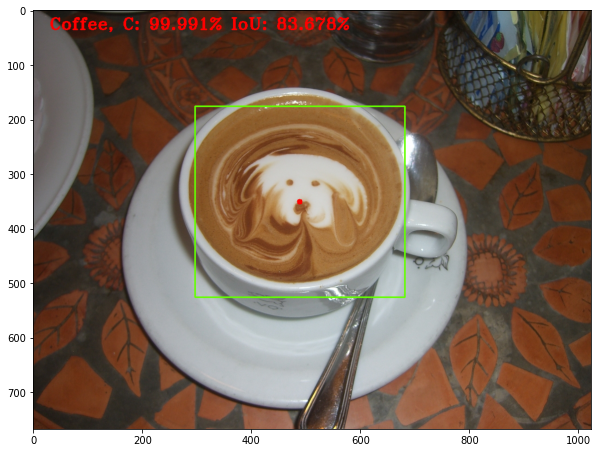

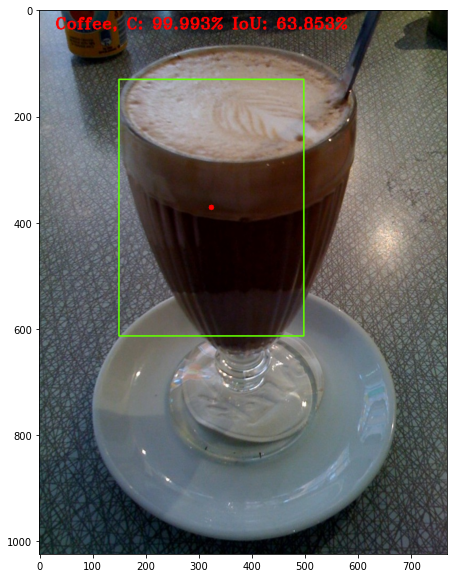

In [ ]:
predict(test_ds[123]);
predict(test_ds[321]);

Coffee
Height: 408.000, width: 662.000, xc: 432.000, yc: 309.000
Coffee
Height: 539.000, width: 519.000, xc: 423.500, yc: 430.500
Raven
Height: 528.000, width: 454.000, xc: 635.000, yc: 370.000
Headphones
Height: 215.000, width: 218.000, xc: 405.000, yc: 252.500
Headphones
Height: 257.000, width: 502.000, xc: 528.000, yc: 332.500
Headphones
Height: 396.000, width: 615.000, xc: 515.500, yc: 306.000
Coffee
Height: 472.000, width: 222.000, xc: 216.000, yc: 465.000
Raven
Height: 586.000, width: 721.000, xc: 1330.500, yc: 928.000
Coffee
Height: 552.000, width: 584.000, xc: 475.000, yc: 488.000
Coffee
Height: 184.000, width: 157.000, xc: 518.500, yc: 253.000
Coffee
Height: 264.000, width: 376.000, xc: 441.000, yc: 266.000
Coffee
Height: 524.000, width: 683.000, xc: 464.500, yc: 394.000
Headphones
Height: 170.000, width: 174.000, xc: 424.000, yc: 166.000
Coffee
Height: 718.000, width: 869.000, xc: 525.500, yc: 412.000
Coffee
Height: 331.000, width: 579.000, xc: 423.500, yc: 316.500
{'Matrix f

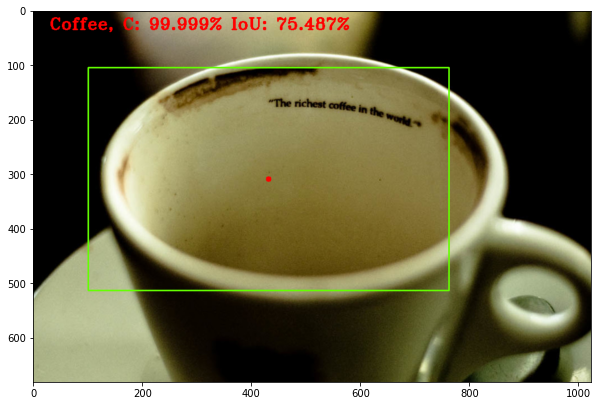

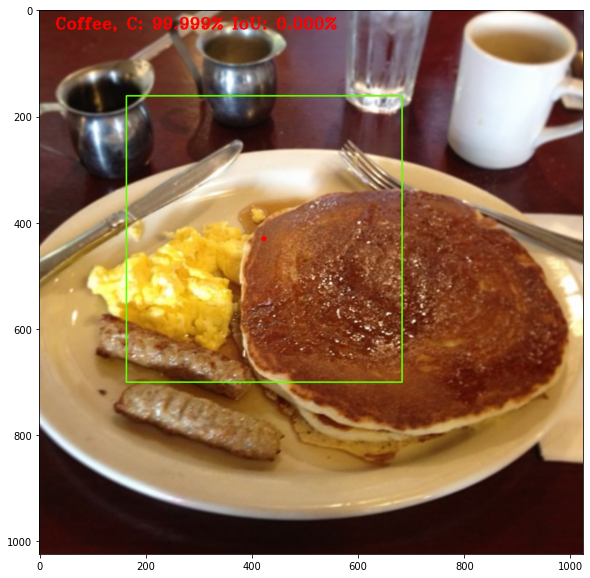

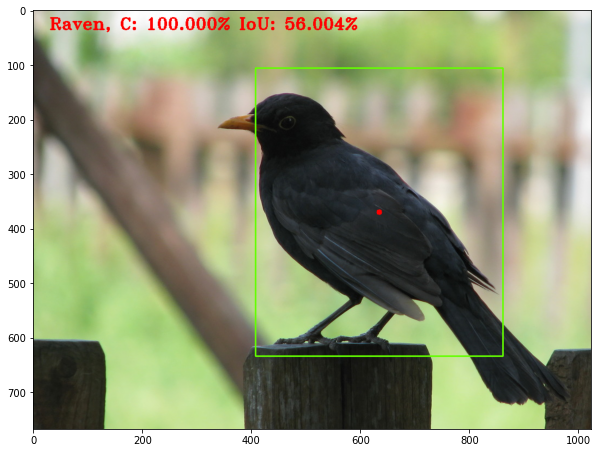

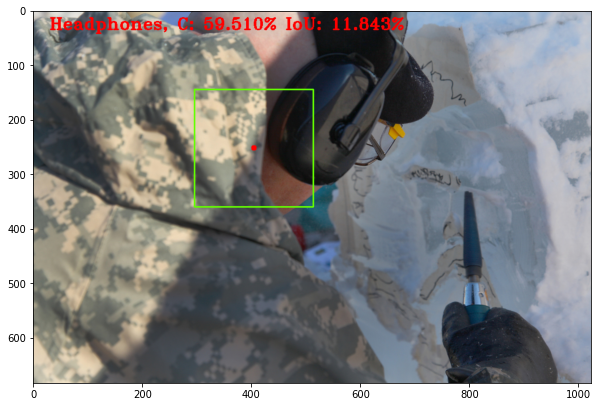

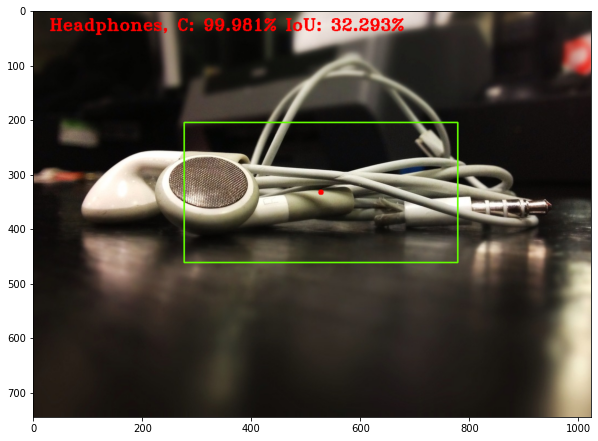

...

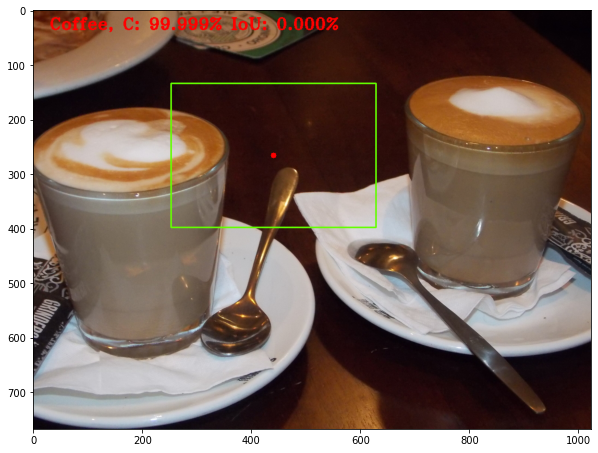

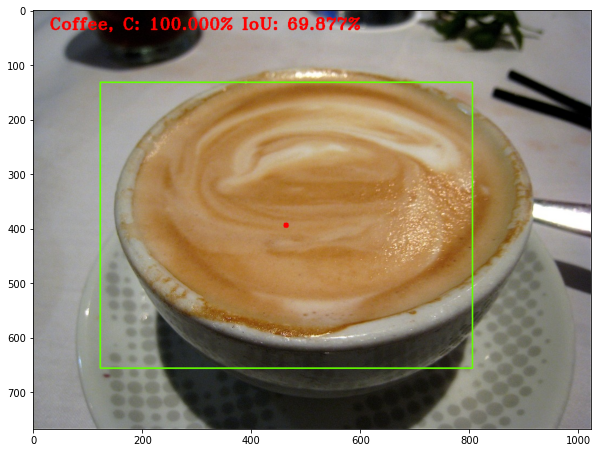

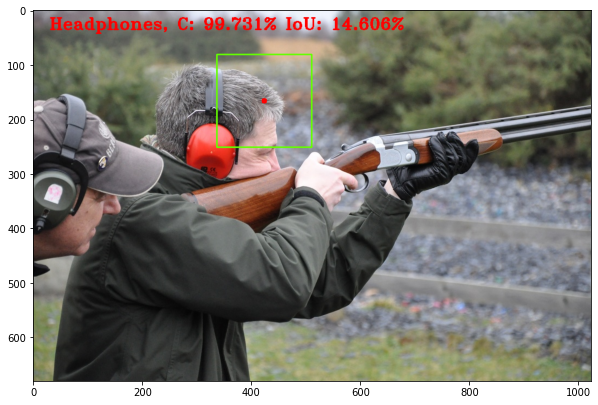

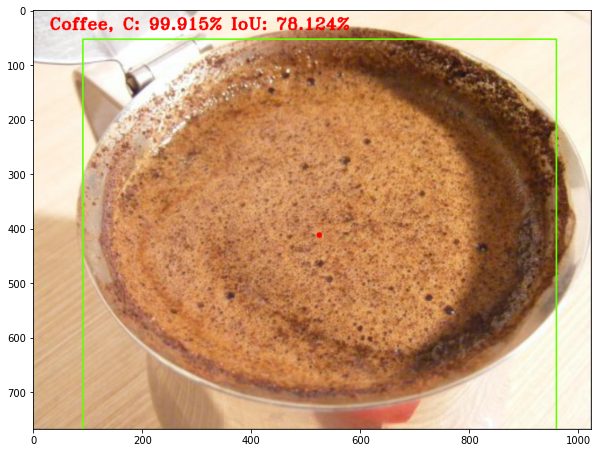

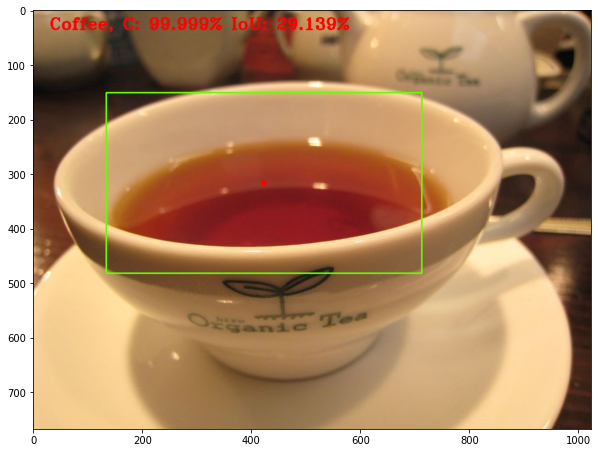

In [ ]:
from collections import Counter
import random

img1 = conf_matrix_each('Raven', test_ds[random.randint(0,671)])
img2 = conf_matrix_each('Raven', test_ds[random.randint(0,671)])
img3 = conf_matrix_each('Raven', test_ds[random.randint(0,671)])
img4 = conf_matrix_each('Raven', test_ds[random.randint(0,671)])
img5 = conf_matrix_each('Raven', test_ds[random.randint(0,671)])
img6 = conf_matrix_each('Headphones', test_ds[random.randint(0,671)])
img7 = conf_matrix_each('Headphones', test_ds[random.randint(0,671)])
img8 = conf_matrix_each('Headphones', test_ds[random.randint(0,671)])
img9 = conf_matrix_each('Headphones', test_ds[random.randint(0,671)])
img10 = conf_matrix_each('Headphones', test_ds[random.randint(0,671)])
img11 = conf_matrix_each('Coffee', test_ds[random.randint(0,671)])
img12 = conf_matrix_each('Coffee', test_ds[random.randint(0,671)])
img13 = conf_matrix_each('Coffee', test_ds[random.randint(0,671)])
img14 = conf_matrix_each('Coffee', test_ds[random.randint(0,671)])
img15 = conf_matrix_each('Coffee', test_ds[random.randint(0,671)])

raven_stats = Counter(img1) + Counter(img2) + Counter(img3) + Counter(img4) + Counter(img5)
headphones_stats = Counter(img6) + Counter(img7) + Counter(img8) + Counter(img9) + Counter(img10)
coffee_stats = Counter(img11) + Counter(img12) + Counter(img13) + Counter(img14) + Counter(img15)

conf_matrix_dict = {'Matrix for raven':raven_stats, 'Matrix for headphones':headphones_stats, 'Matrix for coffee':coffee_stats}
print(conf_matrix_dict)
prec, rec, acc, f1 = compute_metrics(conf_matrix_dict)
print('Precision: ', prec)
print('Recall: ', rec)
print('Accuracy: ', acc)
print('F1: ', f1)

In [ ]:
def conf_matrix_each(for_class, test_data, iou_threshold=0.5):
  image, label, pboxes, path = test_data
  label = num_to_labels[label]
  boxes, result, conf, ratio, p_label = predict(test_data)
  if(for_class == label and label == p_label):
    if(ratio > iou_threshold):
      tp=1
      fp=0
      fn=0
      tn=0
      return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn, 'true_negative': tn}
    else:
      tp=0
      fp=1
      fn=0
      tn=0
      return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn, 'true_negative': tn}
      
  if(for_class == label and label != p_label):
    tp=0
    fp=0
    fn=1
    tn=0
    return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn, 'true_negative': tn}

  if(for_class != label and label == p_label):
    tp=0
    fp=0
    fn=0
    tn=1
    return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn, 'true_negative': tn}

  if(for_class != label and for_class == p_label):
    tp=0
    fp=1
    fn=0
    tn=0
    return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn, 'true_negative': tn}
    



In [ ]:
def calc_iou(gt_bbox, pred_bbox):
    x_topleft_gt, y_topleft_gt, x_bottomright_gt, y_bottomright_gt = gt_bbox
    x_topleft_p, y_topleft_p, x_bottomright_p, y_bottomright_p= pred_bbox
    
    if (x_topleft_gt > x_bottomright_gt) or (y_topleft_gt> y_bottomright_gt):
        raise AssertionError("GT Bounding Box error")
    if (x_topleft_p > x_bottomright_p) or (y_topleft_p> y_bottomright_p):
        raise AssertionError("Predicted Bounding Box error",x_topleft_p, x_bottomright_p,y_topleft_p,y_bottomright_gt)
        
         
    if(x_bottomright_gt< x_topleft_p):
        return 0.0
    if(y_bottomright_gt< y_topleft_p):
        return 0.0
    if(x_topleft_gt> x_bottomright_p):
        return 0.0
    if(y_topleft_gt> y_bottomright_p):
        return 0.0
    
    
    GT_bbox_area = (x_bottomright_gt -  x_topleft_gt + 1) * (  y_bottomright_gt -y_topleft_gt + 1)
    Pred_bbox_area =(x_bottomright_p - x_topleft_p + 1 ) * ( y_bottomright_p -y_topleft_p + 1)
    x_top_left =np.max([x_topleft_gt, x_topleft_p])
    y_top_left = np.max([y_topleft_gt, y_topleft_p])
    x_bottom_right = np.min([x_bottomright_gt, x_bottomright_p])
    y_bottom_right = np.min([y_bottomright_gt, y_bottomright_p])
    
    intersection_area = (x_bottom_right- x_top_left + 1) * (y_bottom_right-y_top_left  + 1)
    
    union_area = (GT_bbox_area + Pred_bbox_area - intersection_area)
   
    return intersection_area/union_area

In [ ]:
def compute_metrics(image_results):
  true_positive = 0
  false_positive = 0
  false_negative = 0
  true_negative = 0
  for img_id, res in image_results.items():
      true_positive +=res['true_positive']
      false_positive += res['false_positive']
      false_negative += res['false_negative']
      true_negative += res['true_negative']
      try:
          precision = true_positive/(true_positive+ false_positive)
      except ZeroDivisionError:
          precision=0.0
      try:
          recall = true_positive/(true_positive + false_negative)
      except ZeroDivisionError:
          recall=0.0
      try:
          accuracy = (true_negative + true_positive)/(true_negative + true_positive + false_negative + false_positive)
      except ZeroDivisionError:
          accuracy = 0.0
      try:
          f1 = 2 * ((precision * recall)/(precision + recall))
      except ZeroDivisionError:
          f1 = 0.0
      
  return (precision, recall, accuracy, f1)